In [1]:
import matplotlib.pyplot as plt
import imageio
from andi_datasets.models_phenom import models_phenom
from andi_datasets.video_generation import get_video_andi, convert_uint8

C:\Users\Gorka\anaconda3\lib\site-packages\deeptrack\backend\_config.py:11: UserWarning: cupy not installed. GPU-accelerated simulations will not be possible
  warnings.warn(
C:\Users\Gorka\anaconda3\lib\site-packages\deeptrack\backend\_config.py:25: UserWarning: cupy not installed, CPU acceleration not enabled
  warnings.warn("cupy not installed, CPU acceleration not enabled")


### 1. Single state diffusion

In [2]:
T = 50 # number of time steps (frames)
N = 50 # number of particles (trajectories)
L = 1.5 * 128 # length of the box (pixels) -> exteneding fov by 1.5 times
D = 1 # diffusion coefficient (pixels^2/frame)

In [3]:
trajs_model1, labels = models_phenom().single_state(N=N, L=L, T=T, Ds=D, alphas=0.5)

### 6.1. Generating videos
``get_video_andi`` will create a feature required to generate videos in deeptrack. 

In [4]:
dic = {'snr': 10}

video = get_video_andi(trajs_model1, noise_kwargs=dic)

10


In order to generate the video into an image stack, one can use ``update().resolve()`` methods as shown below

In [5]:
video_frames = video.update().resolve()

C:\Users\Gorka\anaconda3\lib\site-packages\deeptrack\optics.py:221: RuntimeWarning: invalid value encountered in sqrt
  * np.sqrt(1 - (NA / refractive_index_medium) ** 2 * RHO),


In [6]:
video_frames_uint8 = convert_uint8(video_frames)
imageio.mimwrite("video2.mp4", video_frames_uint8, fps=10)

In [10]:
video_frames[0].shape

(128, 128, 1)

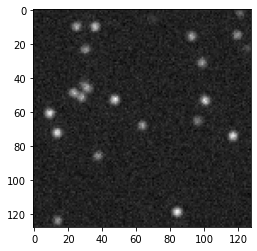

In [11]:
plt.imshow(video_frames[0], cmap="gray")

Alternatively the videos can played directly in jupyter notebook, using ``plot()`` method after ``update()``

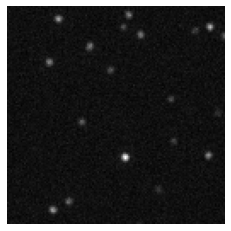

In [10]:
video.update().plot(cmap="gray")